In [1]:
import tensorflow as tf
import os
import tensorflow as tf
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
base_dir = '/content/drive/My Drive/Dataset/'

# Directories for each class
train_dir = f'./train'
validation_dir = f'./valid'

In [53]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        brightness_range=[0.2, 1.0],
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

# YOUR IMAGE SIZE SHOULD BE 150x150
train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                        batch_size=16,
                                                        class_mode='categorical',
                                                        target_size=(300, 300))

validation_datagen = ImageDataGenerator(rescale=1./255)

# Pass in the appropriate arguments to the flow_from_directory method
validation_generator = validation_datagen.flow_from_directory(directory=validation_dir,
                                                              batch_size=16,
                                                                  class_mode='categorical',
                                                                  target_size=(300, 300))


Found 350 images belonging to 5 classes.


Found 100 images belonging to 5 classes.


In [83]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(300, 300, 3)),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(521, activation='relu',),
    tf.keras.layers.Dense(256, activation='relu',),
    tf.keras.layers.Dense(128, activation='relu',),
    #tf.keras.layers.Dropout(0.5),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(5, activation='softmax')
])

In [59]:
model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_45 (Conv2D)              │ (None, 298, 298, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 149, 149, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 147, 147, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_46 (MaxPooling2D) │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 71, 71, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_47 (MaxPooling2D) │ (None, 35, 35, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 33, 33, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_48 (MaxPooling2D) │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 14, 14, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_49 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 521)            │     6,535,945 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 5)              │         2,610 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,517,051 (28.68 MB)

 Trainable params: 7,517,051 (28.68 MB)

 Non-trainable params: 0 (0.00 B)

In [79]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') > 0.85 and logs.get('val_accuracy') > 0.85 and logs.get('loss') < 0.5 and logs.get('val_loss') < 0.75:
            print("\nReached 85% accuracy, stopping training")
            self.model.stop_training = True

callbacks = myCallback()

In [84]:
model.compile(optimizer=RMSprop(learning_rate=0.0005),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [87]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=250,
    verbose=1,
    callbacks=[callbacks]
)

Epoch 1/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 13s 489ms/step - accuracy: 0.4437 - loss: 1.1976 - val_accuracy: 0.5100 - val_loss: 1.0397
Epoch 2/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 463ms/step - accuracy: 0.4781 - loss: 1.1483 - val_accuracy: 0.4500 - val_loss: 1.1169
Epoch 3/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 466ms/step - accuracy: 0.5124 - loss: 1.0746 - val_accuracy: 0.5600 - val_loss: 0.9517
Epoch 4/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 475ms/step - accuracy: 0.4688 - loss: 1.1307 - val_accuracy: 0.4800 - val_loss: 1.0273
Epoch 5/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 470ms/step - accuracy: 0.5038 - loss: 1.1676 - val_accuracy: 0.5400 - val_loss: 1.1019
Epoch 6/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 480ms/step - accuracy: 0.5023 - loss: 1.0781 - val_accuracy: 0.5100 - val_loss: 1.0628
Epoch 7/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 473ms/step - accuracy: 0.5210 - loss: 1.0736 - val_accuracy: 0.6300 - val_loss: 0.9447
Epoch 8/250
22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 468ms/step - accuracy: 0.5191 - loss: 1.0777 - 

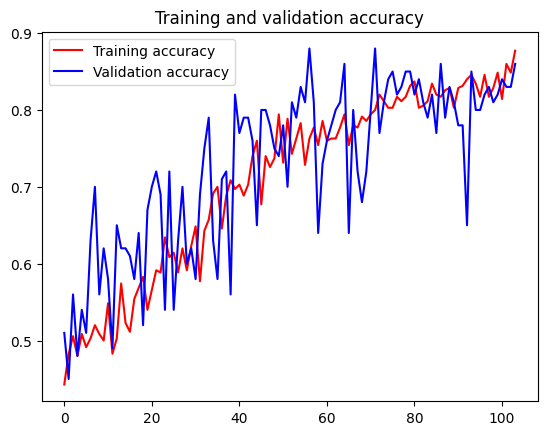

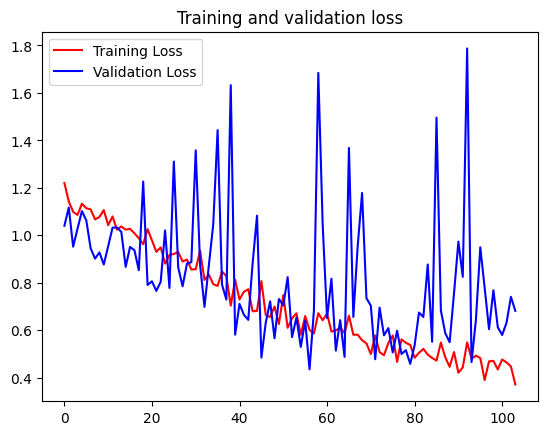

In [88]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from PIL import Image
import os

def preprocess_image(file_path):
    img = Image.open(file_path)
    img = img.resize((300, 300))  # Resize the image to 150x150 pixels
    img_array = image.img_to_array(img)  # Convert the image to a numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Add a batch dimension
    img_array /= 255.0  # Normalize the image array
    return img_array


In [90]:
def make_prediction(uploaded_file):
    img_array = preprocess_image(uploaded_file)
    prediction = model.predict(img_array)
    return prediction

Processing images in folder: test/ayam


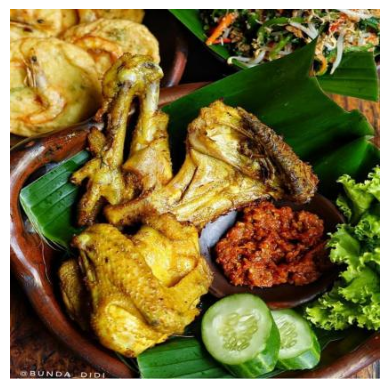

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 0.77


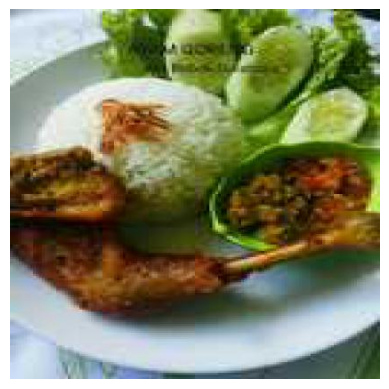

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 0.99


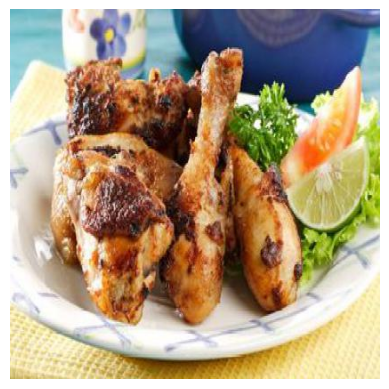

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 1.00


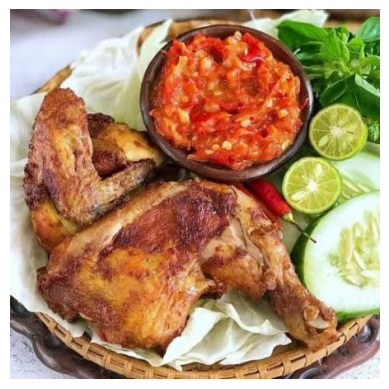

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 1.00


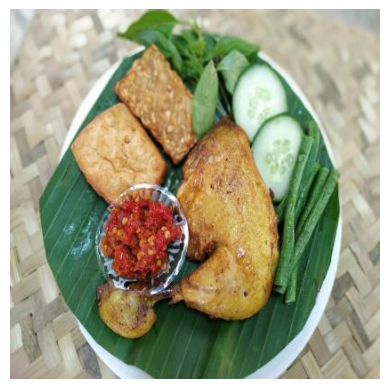

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
The image in folder test/ayam is predicted to be tahu with a confidence of 0.99


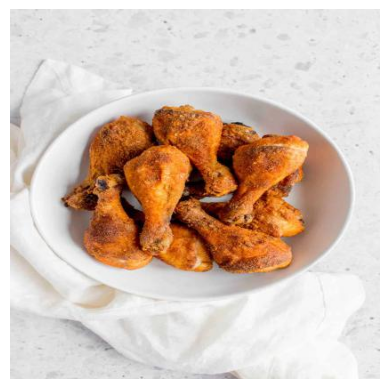

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 1.00


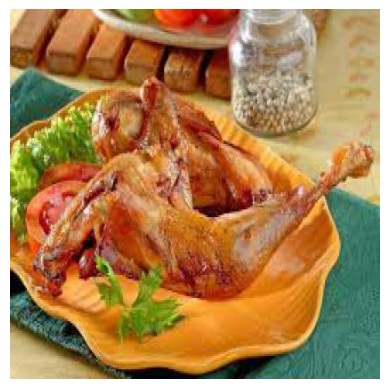

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 0.97


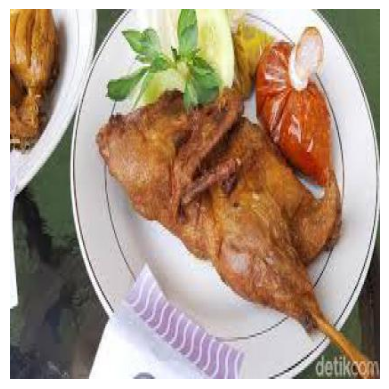

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 1.00


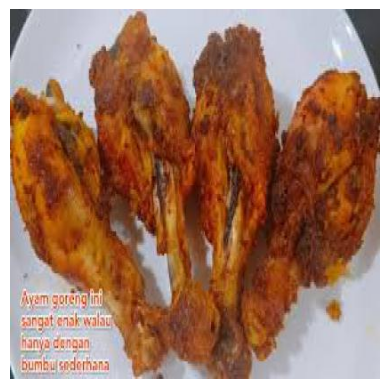

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 1.00


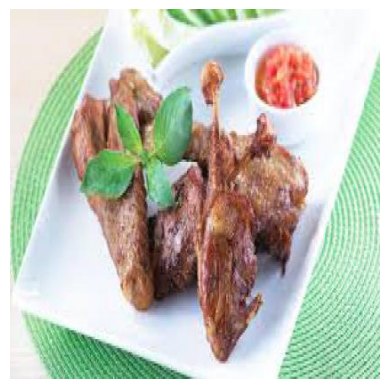

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
The image in folder test/ayam is predicted to be ayam with a confidence of 1.00
Processing images in folder: test/nasi


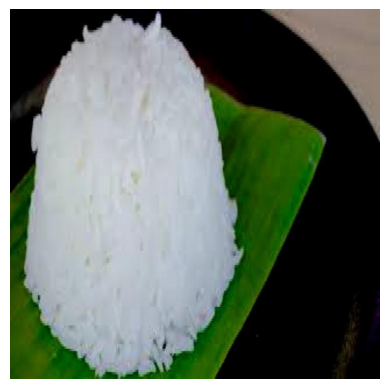

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


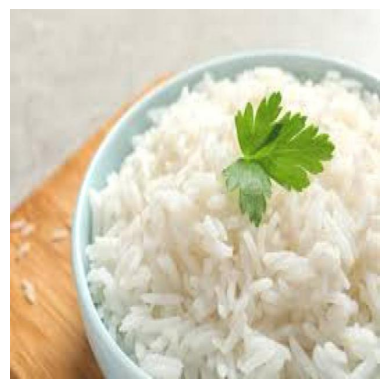

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


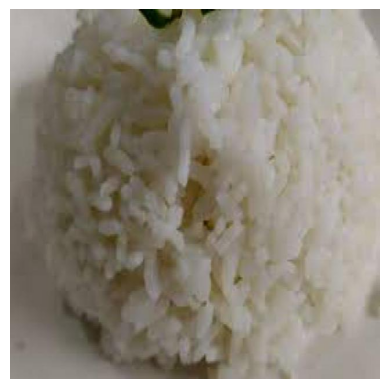

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


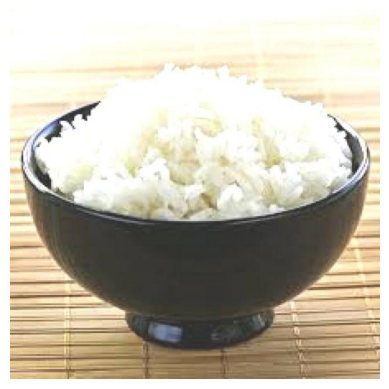

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


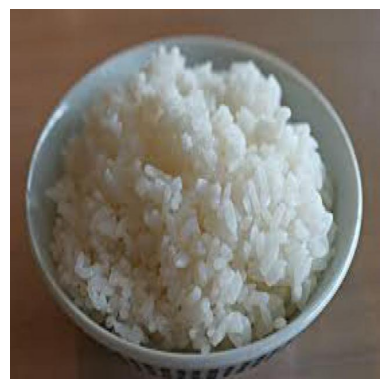

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


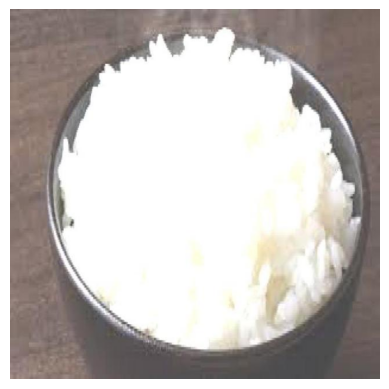

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


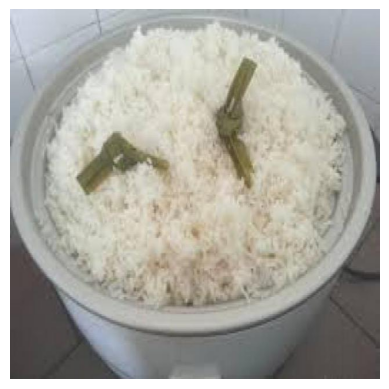

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


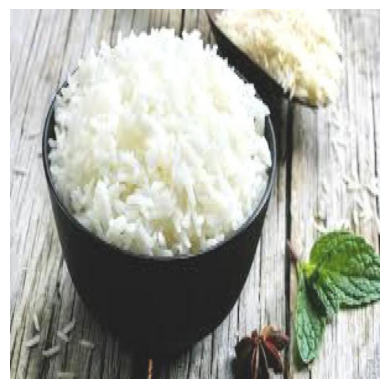

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


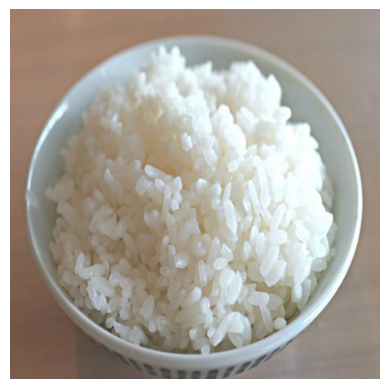

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00


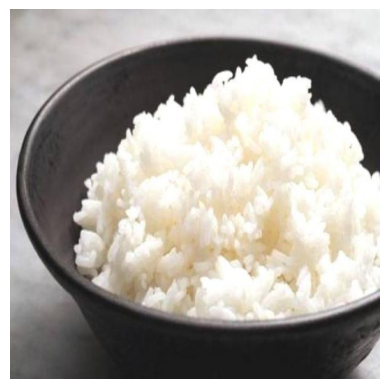

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The image in folder test/nasi is predicted to be nasi with a confidence of 1.00
Processing images in folder: test/tahu


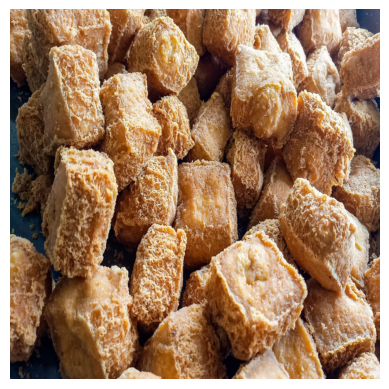

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
The image in folder test/tahu is predicted to be ayam with a confidence of 1.00


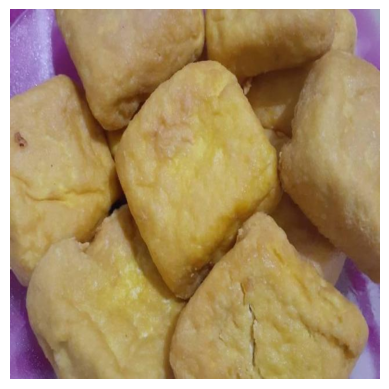

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 1.00


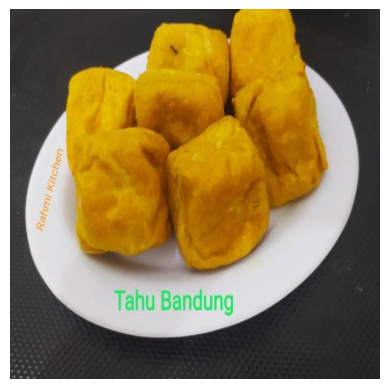

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 1.00


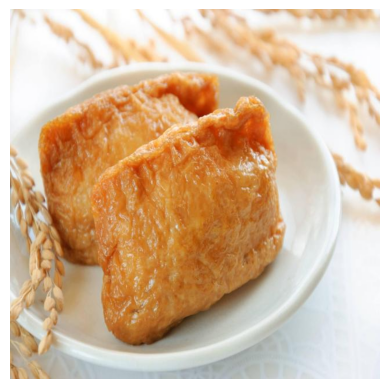

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image in folder test/tahu is predicted to be tempe with a confidence of 0.66


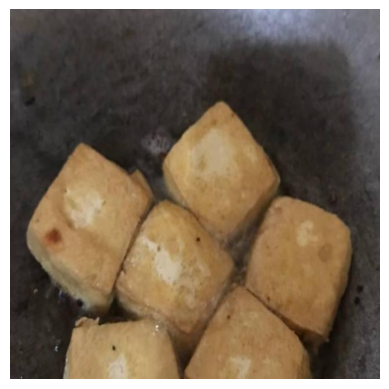

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 0.96


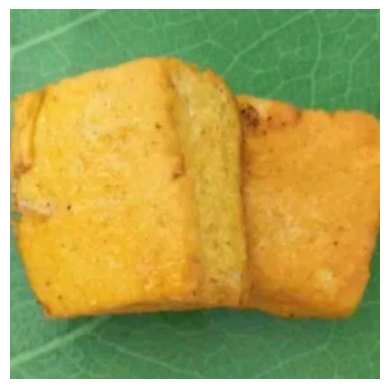

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 1.00


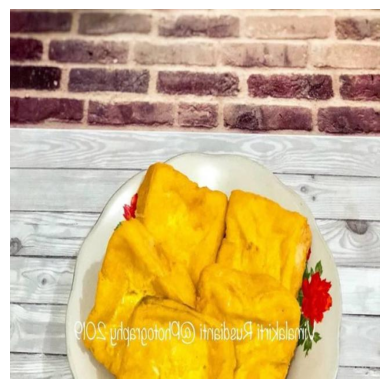

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 1.00


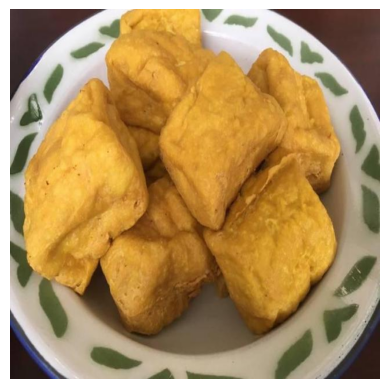

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 0.99


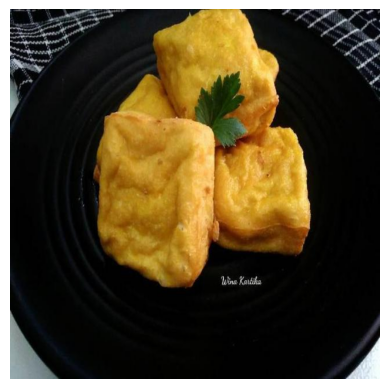

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 0.98


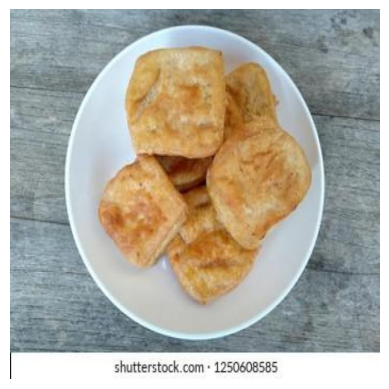

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
The image in folder test/tahu is predicted to be tahu with a confidence of 1.00
Processing images in folder: test/telur


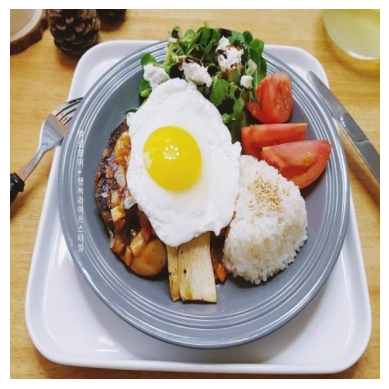

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00


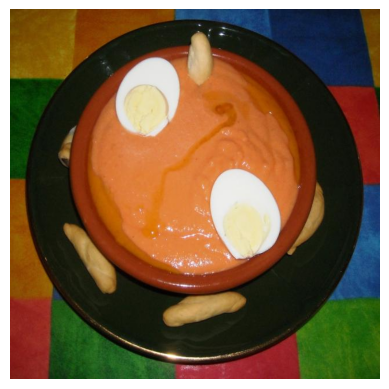

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
The image in folder test/telur is predicted to be ayam with a confidence of 0.99


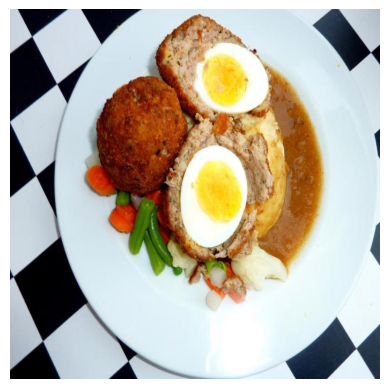

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00


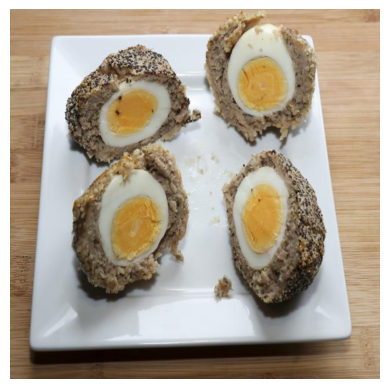

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00


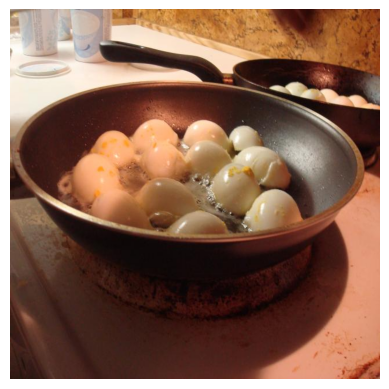

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
The image in folder test/telur is predicted to be telur with a confidence of 0.71


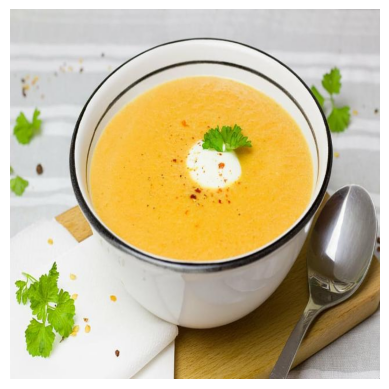

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The image in folder test/telur is predicted to be tahu with a confidence of 1.00


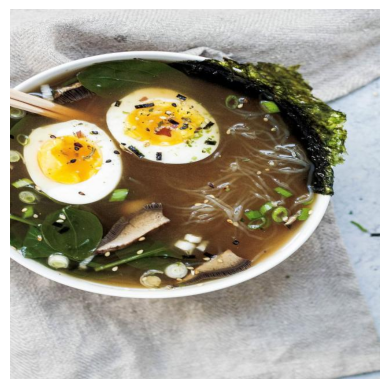

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00


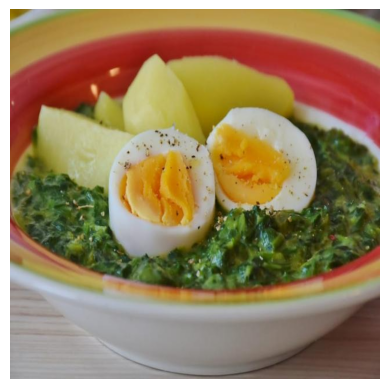

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00


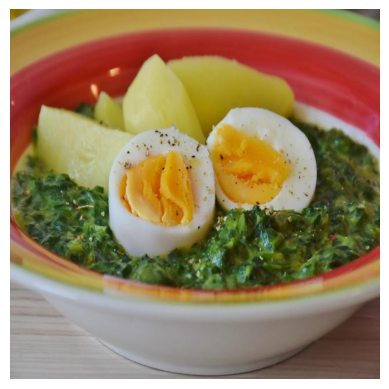

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00


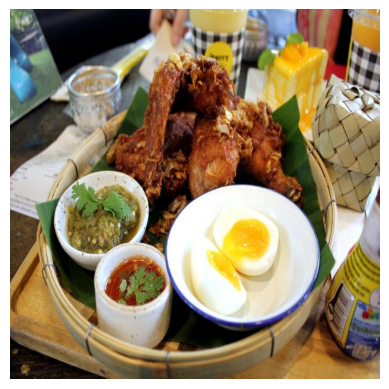

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
The image in folder test/telur is predicted to be telur with a confidence of 1.00
Processing images in folder: test/tempe


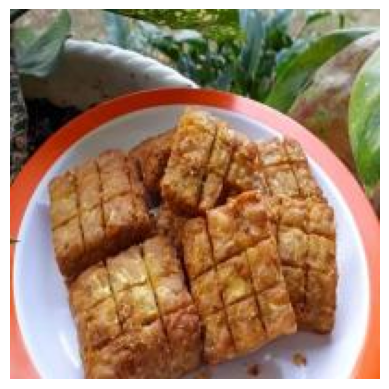

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.96


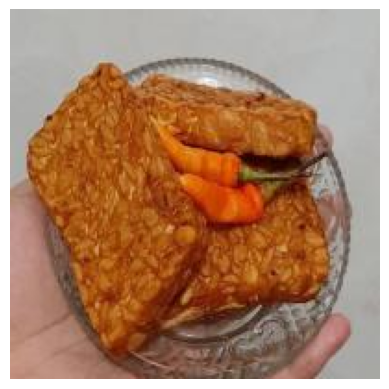

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.90


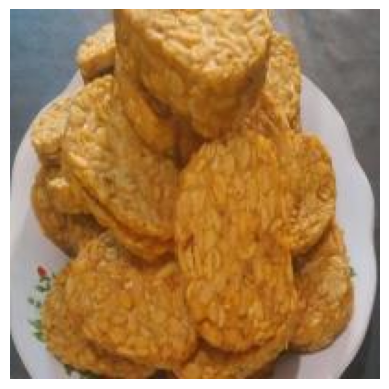

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.67


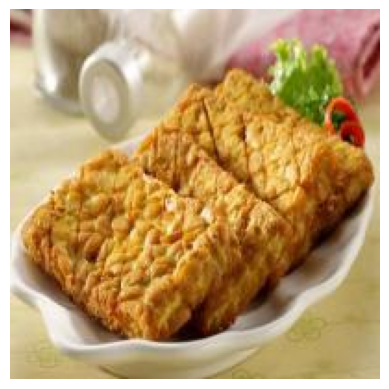

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
The image in folder test/tempe is predicted to be tahu with a confidence of 0.61


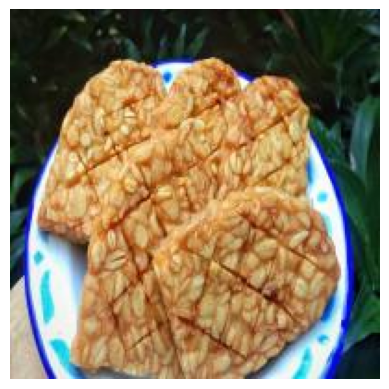

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.92


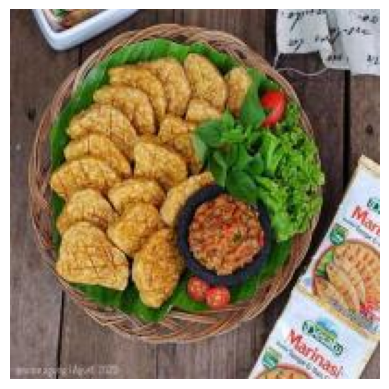

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.74


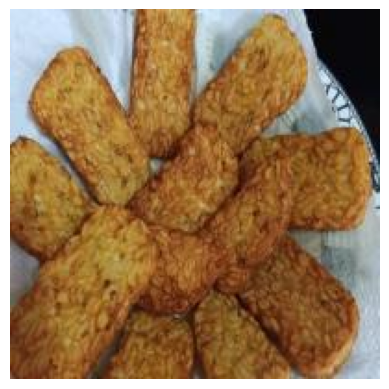

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.72


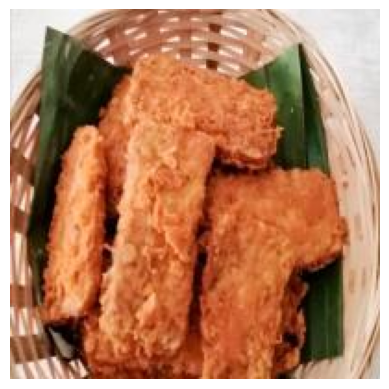

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.82


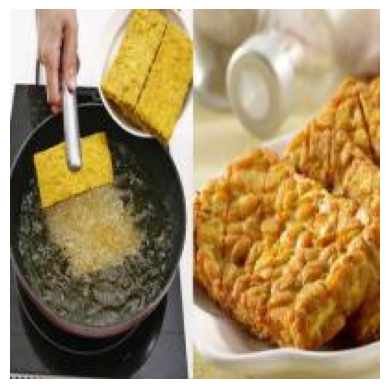

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
The image in folder test/tempe is predicted to be tahu with a confidence of 0.88


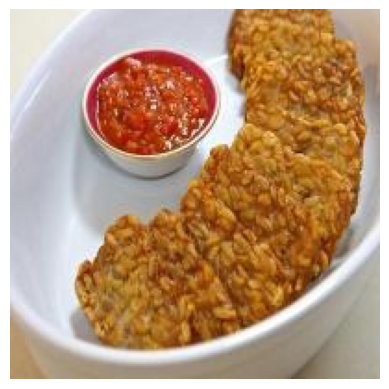

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
The image in folder test/tempe is predicted to be tempe with a confidence of 0.96

Summary of Predictions:
ayam: Total: 10, Correct: 9, Accuracy: 90.00%
nasi: Total: 10, Correct: 10, Accuracy: 100.00%
tahu: Total: 10, Correct: 8, Accuracy: 80.00%
telur: Total: 10, Correct: 8, Accuracy: 80.00%
tempe: Total: 10, Correct: 8, Accuracy: 80.00%


In [91]:

# Define the class labels
# class_labels = ['ayam', 'kentang goreng','nasi','pisang', 'tahu', 'telur', 'tempe']

# folder_paths = ["test/ayam", "test/kentang goreng","test/nasi", "test/pisang","test/tahu", "test/telur", "test/tempe"]

class_labels = ['ayam','nasi', 'tahu', 'telur', 'tempe']

folder_paths = ["test/ayam","test/nasi", "test/tahu", "test/telur", "test/tempe"]

class_results = {class_label: {'total': 0, 'correct': 0} for class_label in class_labels}

# Iterate through each folder
for folder_path, label in zip(folder_paths, class_labels):
    print(f"Processing images in folder: {folder_path}")
    
    # Check if the folder exists
    if os.path.exists(folder_path):
        # Iterate through each file in the folder
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)
            
            # Check if the file is an image file
            if file_path.endswith(".jpg") or file_path.endswith(".jpeg") or file_path.endswith(".png"):
                # Open and display the image
                img = Image.open(file_path)
                plt.imshow(img)
                plt.axis('off')
                plt.show()

                # Make a prediction
                prediction = make_prediction(file_path)
                predicted_class = np.argmax(prediction, axis=1)[0]
                confidence = np.max(prediction)

                class_results[label]['total'] += 1
                if class_labels[predicted_class] == label:
                    class_results[class_labels[predicted_class]]['correct'] += 1
                    
                # Display the prediction
                print(f'The image in folder {folder_path} is predicted to be {class_labels[predicted_class]} with a confidence of {confidence:.2f}')
                
            else:
                print(f"Ignoring non-image file: {file_path}")
    else:
        print(f"Folder not found: {folder_path}")

# Print the summary
print("\nSummary of Predictions:")
for class_label in class_labels:
    total = class_results[class_label]['total']
    correct = class_results[class_label]['correct']
    accuracy = (correct / total) * 100 if total > 0 else 0
    print(f"{class_label}: Total: {total}, Correct: {correct}, Accuracy: {accuracy:.2f}%")

In [92]:
model.save("model_deteksi_makanan_5c_v3_88_37_86_68.h5")

In [35]:
#import tensorflow_decision_forests as tfdf
#print(tf.__version__)
#print(tfdf.__version__)


In [24]:
!tensorflowjs_converter --input_format=keras {saved_model_path} ./


Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\USER\AppData\Roaming\Python\Python311\Scripts\tensorflowjs_converter.exe\__main__.py", line 4, in <module>
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\tensorflowjs\__init__.py", line 21, in <module>
    from tensorflowjs import converters
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\tensorflowjs\converters\__init__.py", line 21, in <module>
    from tensorflowjs.converters.converter import convert
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\tensorflowjs\converters\converter.py", line 38, in <module>
    from tensorflowjs.converters import tf_saved_model_conversion_v2
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\tensorflowjs\converters\tf_saved_model_conversion_v2.py", line 28, in <module>
    import tensorflow_decision_forests
  File 